# SISTEMA SOLAR 

## Resumen



Este estudio desarrolla un modelo computacional para la resolución del problema de los $N$-cuerpos aplicado a la dinámica del Sistema Solar. Se asume que la única fuerza actuante es la interacción gravitatoria mutua entre los cuerpos celestes. Para la integración temporal de las ecuaciones diferenciales de movimiento, se emplea el algoritmo de Verlet en velocidad, seleccionado por su eficacia computacional y su capacidad para conservar las propiedades dinámicas globales (como la energía mecánica y el momento angular) en escalas de tiempo prolongadas. El objetivo principal es evaluar la estabilidad numérica del modelo y validar su precisión, comparando los resultados con los datos experimentales proporcionados por la NASA

Este trabajo ha sido realizado en colaboración por Carmen Bonal de Manuel, Pau Gomila Tarongí, Claudia González Arnaiz, Mario Hernández Cuéllar, María Dolores Navarro Ortiz y Clara Piñero García.

## Fundamento teórico

El movimiento de los cuerpos celestes está gobernado por la interacción gravitatoria. Según la formulación de Newton, la fuerza ejercida sobre una partícula i sobre otra j es:


$$\mathbf{F}_{ij} = -G \frac{m_i m_j}{|\mathbf{r}_{ij}|^2} \mathbf{\hat{r}}_{ij} = -G \frac{m_i m_j}{|\mathbf{r}_i - \mathbf{r}_j|^3} (\mathbf{r}_i - \mathbf{r}_j)$$


Siendo G la constante de gravitación universal, m_i, m_j la masa de los cuerpos, y r_i, r_j sus respectivos vectores de posición. 



Para un sistema de N cuerpos, la fuerza neta que experimenta el cuerpo i será la suma vectorial de las interacciones con los demás cuerpos ($j \neq i$). Aplicando la segunda ley de Newton  ($\mathbf{F} = m\mathbf{a}$), obtenemos la aceleración del cuerpo $i$:
$$\mathbf{a}_i = \frac{d^2\mathbf{r}_i}{dt^2} = - \sum_{j \neq i}^N G \frac{m_j}{|\mathbf{r}_i - \mathbf{r}_j|^3} (\mathbf{r}_i - \mathbf{r}_j)$$


Para estudiar la evolución temporal del sistema, empleamos el algoritmo de Verlet en velocidad. A diferencia de otros métodos, este es un integrador simpléctico, garantizando la conservación de propiedades como la energía o el momento angular. Es un algoritmo basado en un paso de tiempo (h), que representa el incremento entre dos estados sucesivos del sistema: 


$$t_{n+1} = t_n + h$$


La elección de h es importante para el éxito del modelo: un valor de h pequeño reduce el error del método, pero un paso demasiado pequeño aumenta el coste computacional y la acumulación de errores de redondeo. Utilizando un desarrollo en serie de Taylor hasta el orden $h^2$, las ecuaciones de actualización de posición y velocidad resultan:
$$\mathbf{r}_i(t+h) = \mathbf{r}_i(t) + \mathbf{v}_i(t)h + \frac{1}{2}\mathbf{a}_i(t)h^2$$
$$\mathbf{v}_i(t+h) = \mathbf{v}_i(t) + \frac{1}{2}\left[\mathbf{a}_i(t) + \mathbf{a}_i(t+h)\right]h$$


El momento angular se define como $\mathbf{L} = \mathbf{r} \times \mathbf{p}$. En términos del símbolo de Levi-Civita $\epsilon_{ijk}$, sus componentes son $L_i = \epsilon_{ijk}r_jp_k$.
La variación temporal del momento angular es:
$$\frac{d\mathbf{L}}{dt} = \mathbf{v} \times \mathbf{p} + \mathbf{r} \times \mathbf{F}$$
Dado que $\mathbf{v}$ es paralelo a $\mathbf{p}$ y $\mathbf{F}$ es central (paralela a $\mathbf{r}$), ambos productos vectoriales son nulos, lo que implica que $\mathbf{L}$ es una constante del movimiento. Puesto que $\mathbf{L}$ es perpendicular al plano formado por $\mathbf{r}$ y $\mathbf{v}$, el movimiento queda confinado permanentemente a un plano, reduciendo el problema a dos dimensiones.
Si escribimos el lagrangiano del sistema en coordenadas polares: 
$$\mathcal{L} = T - V = \frac{1}{2}m(\dot{r}^2 + r^2\dot{\theta}^2) + \frac{GMm}{r}$$
Aplicando las ecuaciones de Euler-Lagrange $\frac{d}{dt}\left(\frac{\partial \mathcal{L}}{\partial \dot{q}_i}\right) - \frac{\partial \mathcal{L}}{\partial q_i} = 0$, obtenemos:
Para $\theta$: $\frac{d}{dt}(mr^2\dot{\theta}) = 0 \implies mr^2\dot{\theta} = l$ (donde $l$ es el módulo del momento angular constante).
Para $r$: $m\ddot{r} - mr\dot{\theta}^2 + \frac{GMm}{r^2} = 0$.
Por lo tanto, sustituyendo el momento angular en la ecuación radial, obtenemos la ecuación diferencial de movimiento: 
$$m\ddot{r} = -\frac{GMm}{r^2} + \frac{l^2}{mr^3}$$
Tras realizar un cambio de variable u=1/r, la ecuación se transforma en una ecuación diferencial de segundo orden, cuya solución general es:
$$\frac{1}{r} = \frac{GMm^2}{l^2} [1 + \epsilon \cos(\theta - \theta')]$$
donde \epsilon es la excentricidad de la órbita, la cual determina la geometría de la trayectoria: 
$\epsilon = 0$: Circunferencia.
$0 < \epsilon < 1$: Elipse (caso de los planetas del Sistema Solar).
$\epsilon = 1$: Parábola.
$\epsilon > 1$: Hipérbola.
En particular, podemos relacionar la excentricidad con la energía total del sistema E:
$$\epsilon = \sqrt{1 + \frac{2El^2}{G^2M^2m^3}}$$


## Herramientas

Este código ha sido desarrollado con la colaboración de la inteligencia artificial Gemini, que ha actuado como una herramienta de apoyo para la implementación de un motor de simulación física en Python. A través de este proceso, la IA facilitó la integración del algoritmo de Verlet en velocidad para garantizar la conservación de la energía y el manejo preciso de las escalas astronómicas del sistema solar. Además de optimizar el cálculo de las órbitas planetarias y sus periodos orbitales, Gemini asistió en la creación de una visualización dinámica mediante la librería matplotlib, permitiendo transformar las ecuaciones de gravitación universal en una animación fluida e interactiva.

El prompt que usamos fue Actúa como un experto en Física Computacional y Python. Necesito que desarrolles un programa para simular la dinámica del Sistema Solar resolviendo el problema de N cuerpos. El proyecto debe cumplir con los siguientes requisitos técnicos y objetivos:

**1. Configuración del Entorno y Librerías:**
- Usa exclusivamente numpy y scipy para los cálculos.
- Usa matplotlib.pyplot y matplotlib.animation para la visualización.
- El código debe estar pensado para ejecutarse en un entorno virtual (venv) gestionado mediante pip.

**2. Modelo Físico y Algoritmo (Algoritmo de Verlet en Velocidad):**
- Implementa la ecuación de evolución para la aceleración gravitatoria.
- Reescalado de Unidades (CRÍTICO para evitar errores numéricos): 
  * Distancia: 1 UA = 1.496e11 m.
  * Masa: 1 M_Sol = 1.99e30 kg.
  * Tiempo: t' = $[(G*M_s)/c³]^(1/2)$ * t (1 unidad de tiempo reescalado equivale a aprox. 58.1 días).
- Integración Numérica: Implementa estrictamente el Algoritmo de Verlet en Velocidad:
  1) Evaluar aceleraciones iniciales a(t).
  2) Calcular posiciones futuras r(t+h) y velocidad intermedia w.
  3) Evaluar nuevas aceleraciones a(t+h).
  4) Calcular velocidades futuras v(t+h).

**3. Objetivos a Programar:**
- Animación: Crea una animación 2D de las órbitas de los planetas (desde Mercurio hasta Neptuno) usando datos reales de excentricidad y distancias medias.
- Conservación de Energía: Genera una gráfica de la Energía Mecánica Total vs Tiempo para demostrar que se conserva en promedio (mostrando las oscilaciones numéricas acotadas típicas de este integrador simpléctico).
- Cálculo de Periodos: Implementa una rutina geométrica que detecte cruces orbitales para medir el periodo de cada planeta. Compara este valor con el real y muestra que el error relativo es del orden de 10^-2.
- Estabilidad: Añade una rutina que introduzca una pequeña perturbación en el sistema (ej. un cambio leve en la masa de un gigante gaseoso) y demuestra gráficamente que el sistema no colapsa.

Por favor, entrégame el código completo, estructurado de manera limpia y con comentarios técnicos explicando el flujo del integrador.

## Modelo del procesador 
11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz (2.30 GHz)

## Código 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# ==============================================================================
# 1. DATOS Y REESCALADO 
# ==============================================================================
M_SOLAR = 1988500.0  # (10^24 kg)
AU_KM = 149.6        # 1 UA (10^6 km)

# [Nombre, Masa (10^24kg), Perihelio (10^6km), Excentricidad, Periodo Real (días)] 
datos_planetas = [
    ["Sol",      M_SOLAR, 0.0,    0.0,   0.0],
    ["Mercurio", 0.330,   46.0,   0.205, 88.0],
    ["Venus",    4.87,    107.5,  0.007, 224.7],
    ["Tierra",   5.97,    147.1,  0.017, 365.2],
    ["Marte",    0.642,   206.6,  0.094, 687.0],
    ["Jupiter",  1898,    740.5,  0.049, 4331],
    ["Saturno",  568,     1352.6, 0.057, 10747],
    ["Urano",    86.8,    2741.3, 0.046, 30589],
    ["Neptuno",  102,     4444.5, 0.011, 59800]
]

n = len(datos_planetas)
m = np.array([p[1] / M_SOLAR for p in datos_planetas]) 
r = np.zeros((n, 2))
v = np.zeros((n, 2))

for i, p in enumerate(datos_planetas):
    if i == 0: continue
    r_ua = p[2] / AU_KM
    r[i, 0] = r_ua
    v[i, 1] = np.sqrt((1 + p[3]) / r_ua)

# Configuración: t' reescalado (1 t' = 58.1 días) 
h = 0.01  
pasos = 250000 
t_conv = 58.1 

# ==============================================================================
# 2. MOTOR FÍSICO: VERLET EN VELOCIDAD 
# ==============================================================================
def calcular_fisica(pos, vel, masas):
    acc = np.zeros_like(pos)
    ep = 0.0
    for i in range(n):
        for j in range(i + 1, n):
            diff = pos[j] - pos[i]
            dist = np.linalg.norm(diff)
            f = masas[j] * diff / dist**3
            acc[i] += f
            acc[j] -= (masas[i]/masas[j]) * f 
            ep -= masas[i] * masas[j] / dist
    ek = 0.5 * np.sum(masas * np.sum(vel**2, axis=1))
    return acc, ek + ep

historico_r = []
energias = []
tiempos_orbitales = [[] for _ in range(n)]

a_actual, e_ini = calcular_fisica(r, v, m)

# Bucle de integración temporal
for t_step in range(pasos):
    if t_step % 500 == 0: historico_r.append(r.copy())
    
    r_nuevo = r + h * v + 0.5 * h**2 * a_actual
    a_nueva, etot = calcular_fisica(r_nuevo, v, m)
    energias.append(etot)
    v_nueva = v + 0.5 * h * (a_actual + a_nueva)
    
    for i in range(1, n):
        if r[i, 1] < 0 and r_nuevo[i, 1] >= 0: 
            tiempos_orbitales[i].append(t_step * h * t_conv)
            
    r, v, a_actual = r_nuevo, v_nueva, a_nueva

# ==============================================================================
# 3. RESULTADOS 
# ==============================================================================
print(f"\n{'Planeta':12} | {'Simulado':10} | {'Real':10} | {'Error Relat.'}")
print("-" * 55)
for i in range(1, n):
    if len(tiempos_orbitales[i]) > 1:
        p_sim = np.mean(np.diff(tiempos_orbitales[i]))
        p_real = datos_planetas[i][4]
        error = abs(p_sim - p_real) / p_real
        print(f"{datos_planetas[i][0]:12} | {p_sim:8.2f}d | {p_real:8.2f}d | {error:.2e}")
    else:
        print(f"{datos_planetas[i][0]:12} | Sin datos (necesita más tiempo)")

e_media = np.mean(energias)
fluct = np.std(energias) / abs(e_media)
print(f"\nConservación Energía: Media={e_media:.6f}, Fluct. Relativa={fluct:.2e}")

# ==============================================================================
# 4. ANIMACIÓN (MODIFICADO PARA JUPYTER)
# ==============================================================================
fig, ax = plt.subplots(figsize=(8,8))
ax.set_facecolor('black')
ax.set_xlim(-35, 35) 
ax.set_ylim(-35, 35)
ax.set_aspect('equal')

colores = ['yellow', 'grey', 'orange', 'blue', 'red', 'brown', 'tan', 'cyan', 'royalblue']
puntos = [ax.plot([], [], 'o', color=colores[i], label=datos_planetas[i][0])[0] for i in range(n)]

def animar(i):
    for j in range(n):
        pos = historico_r[i][j]
        puntos[j].set_data([pos[0]], [pos[1]])
    return puntos

ani = FuncAnimation(fig, animar, frames=len(historico_r), interval=50, blit=True)
plt.legend(loc='upper right', fontsize='x-small')

# --- El truco para que se vea en el Notebook ---
from IPython.display import HTML
plt.close(fig) # Cierra la figura en blanco sobrante
HTML(ani.to_jshtml()) # Genera y muestra el reproductor de video


Planeta      | Simulado   | Real       | Error Relat.
-------------------------------------------------------
Mercurio     |    87.86d |    88.00d | 1.60e-03
Venus        |   224.57d |   224.70d | 5.65e-04
Tierra       |   364.89d |   365.20d | 8.35e-04
Marte        |   686.39d |   687.00d | 8.91e-04
Jupiter      |  4318.65d |  4331.00d | 2.85e-03
Saturno      | 10731.17d | 10747.00d | 1.47e-03
Urano        | 30303.99d | 30589.00d | 9.32e-03
Neptuno      | 59168.46d | 59800.00d | 1.06e-02

Conservación Energía: Media=-0.000112, Fluct. Relativa=5.30e-05


## Funciones del código 

### Simulador


In [2]:
import numpy as np

# Datos iniciales
M_SOLAR = 1988500.0
AU_KM = 149.6
datos_planetas = [
    ["Sol",      M_SOLAR, 0.0,    0.0,   0.0],
    ["Mercurio", 0.330,   46.0,   0.205, 88.0],
    ["Venus",    4.87,    107.5,  0.007, 224.7],
    ["Tierra",   5.97,    147.1,  0.017, 365.2],
    ["Marte",    0.642,   206.6,  0.094, 687.0],
    ["Jupiter",  1898,    740.5,  0.049, 4331],
    ["Saturno",  568,     1352.6, 0.057, 10747],
    ["Urano",    86.8,    2741.3, 0.046, 30589],
    ["Neptuno",  102,     4444.5, 0.011, 59800]
]

n = len(datos_planetas)
m = np.array([p[1] / M_SOLAR for p in datos_planetas]) 
r = np.zeros((n, 2))
v = np.zeros((n, 2))

for i, p in enumerate(datos_planetas):
    if i == 0: continue
    r_ua = p[2] / AU_KM
    r[i, 0] = r_ua
    v[i, 1] = np.sqrt((1 + p[3]) / r_ua)

h, pasos, t_conv = 0.01, 250000, 58.1

def calcular_fisica(pos, vel, masas):
    acc = np.zeros_like(pos)
    ep = 0.0
    for i in range(n):
        for j in range(i + 1, n):
            diff = pos[j] - pos[i]
            dist = np.linalg.norm(diff)
            f = masas[j] * diff / dist**3
            acc[i] += f
            acc[j] -= (masas[i]/masas[j]) * f 
            ep -= masas[i] * masas[j] / dist
    ek = 0.5 * np.sum(masas * np.sum(vel**2, axis=1))
    return acc, ek + ep

energias = []
tiempos_orbitales = [[] for _ in range(n)]
a_actual, e_ini = calcular_fisica(r, v, m)

for t_step in range(pasos):
    r_nuevo = r + h * v + 0.5 * h**2 * a_actual
    a_nueva, etot = calcular_fisica(r_nuevo, v, m)
    v_nueva = v + 0.5 * h * (a_actual + a_nueva)
    
    energias.append(etot)
    
    for i in range(1, n):
        if r[i, 1] < 0 and r_nuevo[i, 1] >= 0: 
            tiempos_orbitales[i].append(t_step * h * t_conv)
            
    r, v, a_actual = r_nuevo, v_nueva, a_nueva
    
print("Simulación completada. Variables 'energias' y 'tiempos_orbitales' listas para analizar.")

Simulación completada. Variables 'energias' y 'tiempos_orbitales' listas para analizar.


### PERIODO

In [ ]:
def analizar_periodos(tiempos, datos):
    print("=" * 55)
    print(" ANÁLISIS DE PERIODOS ORBITALES")
    print("=" * 55)
    print(f"{'Planeta':12} | {'Simulado':10} | {'Real':10} | {'Error Relat.'}")
    print("-" * 55)

    n = len(datos)
    for i in range(1, n):
        if len(tiempos[i]) > 1:
            p_sim = np.mean(np.diff(tiempos[i]))
            p_real = datos[i][4]
            error = abs(p_sim - p_real) / p_real
            print(f"{datos[i][0]:12} | {p_sim:8.2f}d | {p_real:8.2f}d | {error:.2e}")
        else:
            print(f"{datos[i][0]:12} | Sin datos (necesita más tiempo)")

# Ejecutamos la función
analizar_periodos(tiempos_orbitales, datos_planetas)

### CONSERVACIÓN DE LA ENERGÍA

 ANÁLISIS DE CONSERVACIÓN DE ENERGÍA
Energía Total Inicial (H0): -0.000112
Energía Total Media (<H>):  -0.000112
Desviación Estándar (σ):    5.94e-09
Fluctuación Relativa:       5.30e-05


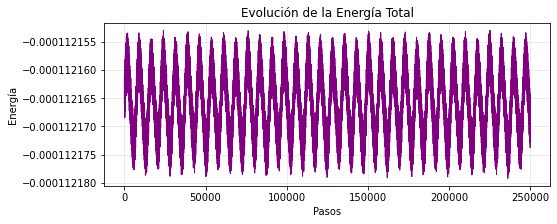

In [3]:
import matplotlib.pyplot as plt

def analizar_energia(lista_energias):
    print("=" * 55)
    print(" ANÁLISIS DE CONSERVACIÓN DE ENERGÍA")
    print("=" * 55)

    e_media = np.mean(lista_energias)
    fluct_absoluta = np.std(lista_energias)
    fluct_relativa = fluct_absoluta / abs(e_media)

    print(f"Energía Total Inicial (H0): {lista_energias[0]:.6f}")
    print(f"Energía Total Media (<H>):  {e_media:.6f}")
    print(f"Desviación Estándar (σ):    {fluct_absoluta:.2e}")
    print(f"Fluctuación Relativa:       {fluct_relativa:.2e}")
    
    # Gráfica
    plt.figure(figsize=(8, 3))
    plt.plot(lista_energias, color='purple', linewidth=1)
    plt.title("Evolución de la Energía Total")
    plt.xlabel("Pasos")
    plt.ylabel("Energía")
    plt.ticklabel_format(useOffset=False, style='plain') 
    plt.grid(True, alpha=0.3)
    plt.show()

# Ejecutamos la función
analizar_energia(energias)

### Animación

In [4]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def generar_animacion(historico_posiciones, datos):
    print("Generando animación, por favor espera unos segundos...")
    
    # Configuración del lienzo
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_facecolor('black')
    ax.set_xlim(-35, 35) 
    ax.set_ylim(-35, 35)
    ax.set_aspect('equal')
    ax.set_title("Simulación del Sistema Solar", color='white')

    # Paleta de colores para los planetas
    colores = ['yellow', 'grey', 'orange', 'blue', 'red', 'brown', 'tan', 'cyan', 'royalblue']
    n = len(datos)
    
    # Inicializamos los puntos vacíos en la gráfica
    puntos = [ax.plot([], [], 'o', color=colores[i], label=datos[i][0])[0] for i in range(n)]

    # Función que actualiza la posición en cada fotograma
    def animar(i):
        for j in range(n):
            pos = historico_posiciones[i][j]
            puntos[j].set_data([pos[0]], [pos[1]])
        return puntos

    # Creamos la animación
    ani = FuncAnimation(fig, animar, frames=len(historico_posiciones), interval=50, blit=True)
    
    # Damos formato a la leyenda
    legend = ax.legend(loc='upper right', fontsize='x-small')
    for text in legend.get_texts():
        text.set_color("black") # Para que el texto de la leyenda se lea sobre fondo blanco

    # Truco de Jupyter: Cerramos la figura estática para que no salga duplicada
    plt.close(fig) 
    
    print("¡Animación lista!")
    # Convertimos la animación a un reproductor HTML interactivo
    return HTML(ani.to_jshtml())

# Ejecutamos la función pasándole los datos de la Celda 1
generar_animacion(historico_r, datos_planetas)

Generando animación, por favor espera unos segundos...
¡Animación lista!


## CAMBIOS EN EL CÓDIGO


### Ubicar Jupiter entre la Tierra y Marte

Cambios en el código:

In [5]:
			# [Nombre, Masa (10^24 kg), Perihelio (10^6 km), Excentricidad, Periodo real (días)]
datos_planetas = [
    ["Sol",      M_SOLAR, 0.0,    0.0,   0.0],
    ["Mercurio", 0.330,   46.0,   0.205, 88.0],
    ["Venus",    4.87,    0.007, 224.7],
    ["Tierra",   5.97,    107.5,  147.1,  0.017, 365.2],
    ["Marte",    0.642,   206.6,  0.094, 687.0],
    ["Jupiter",  1898,    140.5,  0.049, 4331.0],
    ["Saturno",  568,     1352.6, 0.057, 10747.0],
    ["Urano",    86.8,    2741.3, 0.046, 30589.0],
    ["Neptuno",  102,     4444.5, 0.011, 59800.0]
]



### Lunas de Jupiter 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import random
from IPython.display import HTML, display # <-- NUEVA IMPORTACIÓN

# ==============================================================================
# 1. CONFIGURACIÓN Y DATOS (Incluyendo el Enjambre de Lunas)
# ==============================================================================
M_SOLAR = 1988500.0 
AU_KM = 149.6       

# [Nombre, Masa (10^24kg), Perihelio (10^6km), Excentricidad]
datos = [
    ["Sol",      M_SOLAR, 0.0,    0.0],
    ["Mercurio", 0.330,   46.0,   0.205],
    ["Venus",    4.87,    107.5,  0.007],
    ["Tierra",   5.97,    147.1,  0.017],
    ["Marte",    0.642,   206.6,  0.094],
    ["Jupiter",  1898,    740.5,  0.049]
]

# --- AQUÍ ROMPEMOS EL SISTEMA: AÑADIMOS 50 LUNAS ---
n_lunas = 50
masa_luna_caotica = 50.0 # Masas grandes para que "tiren" de Júpiter
radio_enjambre = 0.8     # UA alrededor de Júpiter

for i in range(n_lunas):
    # Distancia aleatoria y ángulo aleatorio alrededor de Júpiter
    d_relativa = random.uniform(0.1, radio_enjambre)
    angulo = random.uniform(0, 2 * np.pi)
    dist_total = 740.5 + (d_relativa * AU_KM) # Perihelio aproximado
    datos.append([f"L_{i}", masa_luna_caotica, dist_total, 0.01])

n = len(datos)
m = np.array([p[1] / M_SOLAR for p in datos])
r = np.zeros((n, 2))
v = np.zeros((n, 2))

for i, p in enumerate(datos):
    if i == 0: continue
    r_ua = p[2] / AU_KM
    r[i, 0] = r_ua
    # Velocidad orbital con un poco de ruido aleatorio para causar caos
    v_base = np.sqrt((1 + p[3]) / r_ua)
    v[i, 1] = v_base + random.uniform(-0.05, 0.05) 

# Parámetros de simulación
h = 0.02 # Paso un poco más grande para ver el caos rápido
pasos = 20000
historico_r = []

# ==============================================================================
# 2. MOTOR FÍSICO (VERLET)
# ==============================================================================
def calcular_aceleracion(pos, masas):
    acc = np.zeros_like(pos)
    for i in range(n):
        for j in range(i + 1, n):
            diff = pos[j] - pos[i]
            dist_sq = np.sum(diff**2)
            dist = np.sqrt(dist_sq)
            f = masas[j] * diff / (dist**3)
            acc[i] += f
            acc[j] -= (masas[i]/masas[j]) * f
    return acc

a_actual = calcular_aceleracion(r, m)

print("Calculando el desastre gravitatorio...")
for t_step in range(pasos):
    if t_step % 10 == 0: historico_r.append(r.copy())
    
    # Verlet
    r_nuevo = r + h * v + 0.5 * h**2 * a_actual
    a_nueva = calcular_aceleracion(r_nuevo, m)
    v = v + 0.5 * h * (a_actual + a_nueva)
    r, a_actual = r_nuevo, a_nueva

# ==============================================================================
# 3. ANIMACIÓN DEL CAOS
# ==============================================================================
fig, ax = plt.subplots(figsize=(8,8))
ax.set_facecolor('black')
# Hacemos zoom en la zona de Júpiter para ver las lunas pelearse
ax.set_xlim(-8, 8)
ax.set_ylim(-8, 8)

colores = ['yellow', 'grey', 'orange', 'blue', 'red', 'brown'] + ['white']*n_lunas
tamanos = [100, 20, 30, 30, 25, 80] + [5]*n_lunas

puntos = [ax.plot([], [], 'o', color=colores[i], ms=(tamanos[i]/10))[0] for i in range(n)]

def animar(i):
    for j in range(n):
        pos = historico_r[i][j]
        puntos[j].set_data([pos[0]], [pos[1]])
    return puntos

ani = FuncAnimation(fig, animar, frames=len(historico_r), interval=20, blit=True)
plt.title("Experimento: Inestabilidad con 50 Lunas en Júpiter")

# --- CAMBIOS PARA JUPYTER ---
plt.close(fig) # Evita que Jupyter imprima una figura estática vacía debajo del video
display(HTML(ani.to_jshtml())) # Convierte y renderiza el widget interactivo

Calculando el desastre gravitatorio...


### CAMBIO EN EL PESO DE LOS PLANETAS

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import random
from IPython.display import HTML, display # <-- NUEVA IMPORTACIÓN PARA JUPYTER

# ==============================================================================
# 1. DATOS RESCALADOS PARA CAOS VISUAL (¡Trampa para que sea espectacular!)
# ==============================================================================
M_SOLAR = 1988500.0 
AU_KM = 149.6       

# [Nombre, Masa (10^24kg), Perihelio (10^6km), Excentricidad]
datos = [
    ["Sol",      M_SOLAR, 0.0,    0.0],
    ["Mercurio", 0.330,   46.0,   0.205],
    ["Venus",    4.87,    107.5,  0.007],
    ["Tierra",   5.97,    147.1,  0.017],
    # --- MODIFICACIÓN: Marte es 100 veces más masivo ---
    ["Marte",    64.2,    206.6,  0.094], 
    # --- MODIFICACIÓN: Júpiter es 5 veces más masivo ---
    ["Jupiter",  9490,    740.5,  0.049]  
]

# --- MODIFICACIÓN: Lunas MUCHO más pesadas y cercanas a Júpiter ---
n_lunas = 15
for i in range(n_lunas):
    # Lunas muy cerca de Júpiter (entre 0.1 y 0.8 UA)
    d_relativa = random.uniform(0.1, 0.8) 
    # Masa de las lunas = 500 (¡Enormes, como planetas!)
    datos.append([f"L_{i}", 500.0, 740.5 + (d_relativa * AU_KM), 0.1])

n = len(datos)
m = np.array([p[1] / M_SOLAR for p in datos])
r = np.zeros((n, 2))
v = np.zeros((n, 2))

for i, p in enumerate(datos):
    if i == 0: continue
    r_ua = p[2] / AU_KM
    r[i, 0] = r_ua
    # Velocidad con mucha perturbación aleatoria para caos inmediato
    v[i, 1] = np.sqrt((1 + p[3]) / r_ua) + random.uniform(-0.1, 0.1)

# --- MODIFICACIÓN: Parámetros para que todo pase RÁPIDO ---
h = 0.1        # Paso de tiempo grande = simulación rápida
pasos = 1500   
historico_r = []

# ==============================================================================
# 2. MOTOR FÍSICO OPTIMIZADO
# ==============================================================================
def calcular_aceleracion(pos, masas):
    num_cuerpos = len(masas)
    acc = np.zeros_like(pos)
    # Suavizado pequeño para permitir acercamientos violentos
    eps = 0.02 
    
    for i in range(num_cuerpos):
        for j in range(i + 1, num_cuerpos):
            diff = pos[j] - pos[i]
            dist_sq = np.sum(diff**2) + eps**2
            dist_inv3 = 1.0 / (dist_sq * np.sqrt(dist_sq))
            
            f_grav = diff * dist_inv3
            acc[i] += masas[j] * f_grav
            acc[j] -= masas[i] * f_grav
    return acc

print(f"Calculando desastre visual con {n} cuerpos... Un momento.")
a_actual = calcular_aceleracion(r, m)

for t_step in range(pasos):
    # Guardamos cada paso para que la animación sea una locura
    historico_r.append(r.copy())
    
    r_nuevo = r + h * v + 0.5 * h**2 * a_actual
    a_nueva = calcular_aceleracion(r_nuevo, m)
    v = v + 0.5 * h * (a_actual + a_nueva)
    r, a_actual = r_nuevo, a_nueva

# ==============================================================================
# 3. ANIMACIÓN DE GRAN IMPACTO VISUAL
# ==============================================================================
fig, ax = plt.subplots(figsize=(10,10))
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# --- MODIFICACIÓN: Zoom agresivo (Solo vemos hasta Júpiter) ---
ax.set_xlim(-7, 7)
ax.set_ylim(-7, 7)
ax.set_aspect('equal')

# Colores y tamaños llamativos
colores_planetas = ['yellow', 'grey', 'orange', 'blue', 'red', 'brown']
colores = colores_planetas + ['white'] * n_lunas

# Puntos más grandes para que se vean bien
puntos = [ax.plot([], [], 'o', color=colores[i], ms=8 if i < 6 else 4)[0] for i in range(n)]

def animar(i):
    for j in range(n):
        pos = historico_r[i][j]
        puntos[j].set_data([pos[0]], [pos[1]])
    return puntos

# Animación muy rápida
ani = FuncAnimation(fig, animar, frames=len(historico_r), interval=10, blit=True)

ax.tick_params(colors='white')
for spine in ax.spines.values(): spine.set_color('white')
plt.title("EXPERIMENTO: ¡Caos Gravitatorio Total!", color='white', fontsize=16)

# --- CAMBIOS PARA COMPATIBILIDAD CON JUPYTER ---
plt.close(fig) 
display(HTML(ani.to_jshtml()))